<a href="https://colab.research.google.com/github/DLesage25/yeyes_v1/blob/main/yeyesv1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Yeyes v1
A neural network designed to identify snake species in Honduras.


#### Motivation
Year after year, there are nearly 700 snake bites reported in Honduras. These occur in relation to a combination of venomous and non-venomous species.

Today, there is no mechanism, technology-enabled or otherwise, available for the identification of a snake species. In a number of snakebite incidents, the pacient has scarce information to provide to medics for proper assessment and (if required) administration of antivenom. On worse scenarios, the pacient does not go to a hospital due being ignorant of if they were bitten by a venomous species or not, and antivenom is administered after the ideal time window, or not administered at all.

##### For Conservation
A tool that helps the layman identify snake species can also support conservation efforts by geotagging the location of identified specimens. Said data can be used to enrich existing datasets and identify active populations of a certain species.

#### Version specifics
Yeyes is an image identification neural network trained on existing, clean, and pre-classified data taken from a number of sources in the region. The datasets are a combination of images and geographical data attributed to each species in the region. This allows the network to identify a species based on both visual and geographical attributes.

Additionally, all visual data is manipulated and augmented to ensure that accuracy is consistent across devices, varying image quality, and subject positioning in the image.

##### Version Limitations

1. This version does not account for more intensive augmentation on the input images. This could result in the model failing to accurately identify species on more extreme color profiles or on images of very low quality
2. This version is entirely predicated on image recognition. There is no sense of recognition through geographical data.

*For all tense and purposes, this model's goal is to establish that—with sufficient data—species can be properly identified from one another purely using visual attributes.*


#### Model demonstration






In [ ]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
! pip install timm
! pip install azure-cognitiveservices-search-imagesearch
import fastbook
fastbook.setup_book()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 55.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.8/47.8 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 197.4/197.4 kB 18.7 MB/s eta 0:00:00
Mounted at /content/gdrive


In [ ]:
#hide
import timm
from fastbook import *
from fastai.vision.widgets import *

In [71]:
from google.colab import userdata
key = userdata.get('AZURE_SEARCH_KEY')

In [ ]:
from itertools import chain

from azure.cognitiveservices.search.imagesearch import ImageSearchClient as api
from msrest.authentication import CognitiveServicesCredentials as auth
import requests

In [72]:
def search_images_bing_many(key, term, min_sz=128, max_images=150, offset=0):
     params = {'q':term, 'count':max_images, 'min_height':min_sz, 'min_width':min_sz, 'offset':offset}
     headers = {"Ocp-Apim-Subscription-Key":key}
     search_url = "https://api.bing.microsoft.com/v7.0/images/search"
     response = requests.get(search_url, headers=headers, params=params)
     response.raise_for_status()
     search_results = response.json()
     return L(search_results['value'])

We start with downloading a number of images from Bothrops Asper, one of the vipers with the most number of snakebite incidents in the Central American region.

In [73]:
results = search_images_bing_many(key, 'porthidium nasutum', offset=10)
ims = results.attrgot('contentUrl')
len(ims)

146

In [ ]:
dest = 'images/porthidium_nasutum.jpg'
download_url(ims[1], dest)
# ims[0]

Path('images/porthidium_nasutum.jpg')

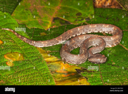

In [ ]:
im = Image.open(dest)
im.to_thumb(128,128)

We then do the same for three unrelated viper species, now including the Porthidium and Crotalus genus.

In [ ]:
viperidae_species = 'Crotalus simus','Bothrops asper','Porthidium nasutum'
path = Path('viperidae')

In [ ]:
n_offsets = 3
if not path.exists():
    path.mkdir()
for o in viperidae_species:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = []
    for offset in range(n_offsets):
      results += search_images_bing_many(key, f'{o}', offset=offset)
    download_images(dest, urls=results.attrgot('contentUrl'))

Confirm the proper download of input images:

In [ ]:
fns = get_image_files(path)
fns

(#1216) [Path('viperidae/Crotalus simus/f5855c01-ffce-4d8f-bead-9b7cfb770943.jpg'),Path('viperidae/Crotalus simus/4091a5a0-ad3c-4b72-9abc-902a215c513d.jpg'),Path('viperidae/Crotalus simus/80967cb4-8d1d-4275-87ef-09d6d15ab475.jpg'),Path('viperidae/Crotalus simus/1c085ebd-e986-4235-b20a-3b02cfd41dc5.jpg'),Path('viperidae/Crotalus simus/fa21ed91-19f9-4100-a815-4e1a60182fec.jpg'),Path('viperidae/Crotalus simus/245a4337-e1b0-46ff-8a33-7221bac0efa0.jpg'),Path('viperidae/Crotalus simus/141077dc-c47d-4b6a-9618-fcb4de66c2d5.jpg'),Path('viperidae/Crotalus simus/6c1d067b-75ad-47c1-ac04-306beb28dbbb.jpg'),Path('viperidae/Crotalus simus/01096429-1cda-40d3-9e4a-1187b2e0c952.jpg'),Path('viperidae/Crotalus simus/9dbc721f-d460-458a-bd5e-cb703cf1f57c.jpg')...]

Clean and unlink invalid images due to image formats or corrupt files.

In [ ]:
failed = verify_images(fns)
print(failed)
failed.map(Path.unlink);

[]


Create a dataloader that utilizes random resized crops, as well as data augmentation through image mutation. This effectively creates duplicates of an image in memory that are each resized, crop, rotated, warped, and illuminated differently.

This ensures the model's accuracy is consistent across image formats, subject positioning, and device color profiles.

In [ ]:
viperidae = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

We first augment input images by performing additional transformations on them. These include rotation, perspective warping, as well as brightness, contrast and saturation changes.

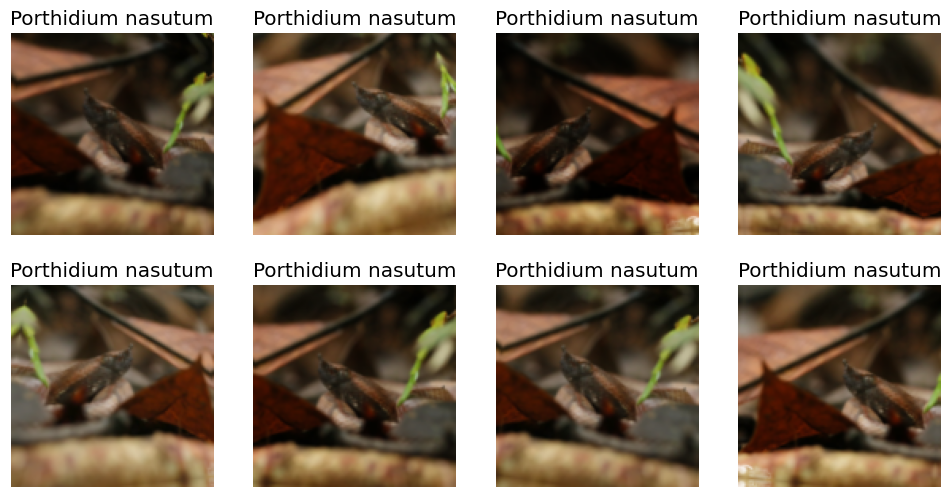

In [ ]:
viperidae = viperidae.new(item_tfms=Resize(128), batch_tfms=aug_transforms())
dls = viperidae.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

We then train the model with the augmented data sample we've collected and transformed, using random resized crops. This adds an additional level of augmentation since it ensures the model is more consistent across varying image formats and subject positions.

In [ ]:
viperidae = viperidae.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = viperidae.dataloaders(path)

We'll use resnet18 for image identification and fine tune over 8 epochs.

In [ ]:
learn = vision_learner(dls, 'convnextv2_tiny', metrics=error_rate)
learn.fine_tune(8)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/115M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,0.786231,0.300725,0.086420,00:22


epoch,train_loss,valid_loss,error_rate,time
0,0.166024,0.120649,0.049383,00:42
1,0.108842,0.062423,0.024691,00:43
2,0.091040,0.016962,0.000000,00:43
3,0.078256,0.024858,0.012346,00:42
4,0.058406,0.016721,0.004115,00:44
5,0.049910,0.010901,0.004115,00:43
6,0.041744,0.009089,0.004115,00:42
7,0.032368,0.008929,0.004115,00:43


By looking at the confusion matrix, there is clearly more work to do in ensuring the model has enough visual and geographical datapoints to property segment species from each other.

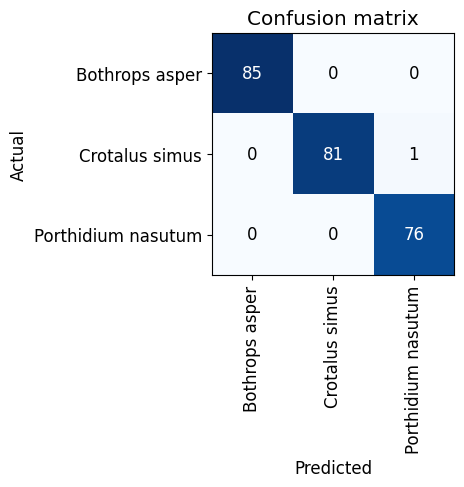

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Let's look at a sample of input with the highest loss.

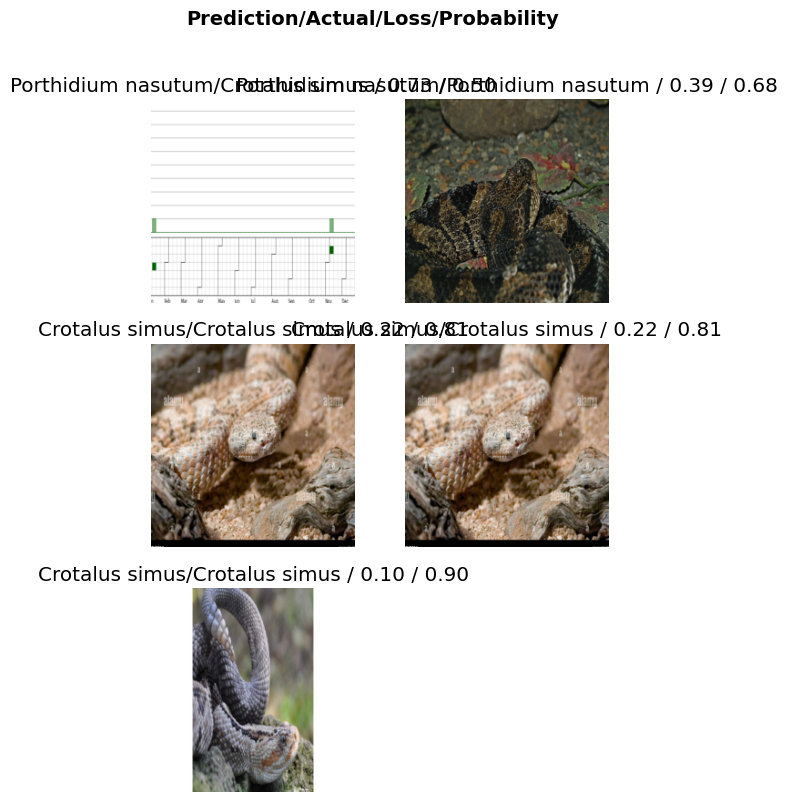

In [ ]:
interp.plot_top_losses(5, nrows=3)

And manually make some corrections on the training set. This would eventually be replaced by a different interface that can be "crowdsourced".

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

We then remove unrelated input images.

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

And reclassified updated images.

In [ ]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

Finally, we test the model in relation to the first image downloaded, a B. asper.

In [ ]:
species,_,probs = learn.predict(PILImage.create('images/porthidium_nasutum.jpg'))
print(f"This is a: {species}.")
print(f"Probability: {probs[0]:.4f}")

This is a: Porthidium nasutum.
Probability: 0.0000


The images used for prediction:

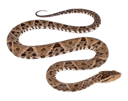

In [ ]:
im = Image.open('images/bothrops_asper.jpg')
im.to_thumb(128,128)

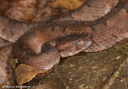

In [ ]:
im = Image.open('images/porthidium.jpg')
im.to_thumb(128,128)

Finally, we export our model.

In [ ]:
learn.export('model_v1_1.pkl')